In [1]:
# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
gcc (Ubuntu 9.3.0-17ubuntu1~20.04) 9.3.0
Copyright (C) 2019 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [2]:
# Check Pytorch installation
import torch, torchvision
print("torch: ",torch.__version__, "; cuda available: ",torch.cuda.is_available())

# Check MMDetection installation
import mmdet
print("mmdet: ",mmdet.__version__)

# Check mmcv installation
import mmcv
print("mmcv: ",mmcv.__version__)
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print("cuda: ",get_compiling_cuda_version())
print(get_compiler_version())

torch:  1.12.0 ; cuda available:  True
mmdet:  2.25.1
mmcv:  1.6.0
cuda:  11.6
GCC 9.3


In [3]:
DATA_DIR_TRAIN = "/data/workspace/data/dataset/data_canola/train"
DATA_DIR_TEST = "/data/workspace/data/dataset/data_canola/test"
DATA_DIR_VAL = "/data/workspace/data/dataset/data_canola/val"
CLASS_LABELS = ['Pod', 'Shatter']
CONFIG_FILE = '/root/git/mmdetection/configs/mask2former/mask2former_r50_lsj_8x2_50e_coco.py'
WEIGHTS_FILE = 'checkpoints/mask2former_r50_lsj_8x2_50e_coco_20220506_191028-8e96e88b.pth'
LOGS_DIR = './logs/test'

In [4]:
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/mask2former/mask2former_r50_lsj_8x2_50e_coco/mask2former_r50_lsj_8x2_50e_coco_20220506_191028-8e96e88b.pth \
      -O checkpoints/mask2former_r50_lsj_8x2_50e_coco_20220506_191028-8e96e88b.pth

## Train a Detector on A Customized Dataset

To train a new detector, there are usually three things to do:
1. Support a new dataset
2. Modify the config
3. Train a new detector



### Support a new dataset

There are three ways to support a new dataset in MMDetection: 
  1. Reorganize the dataset into a COCO format
  2. Reorganize the dataset into a middle format
  3. Implement a new dataset

We recommend the first two methods, as they are usually easier than the third.

In this tutorial, we give an example that converts the data into COCO format because MMDetection **only support evaluating mask AP of dataset in COCO format for now**. Other methods and more advanced usages can be found in the [doc](https://mmdetection.readthedocs.io/en/latest/tutorials/customize_dataset.html).


In [5]:
import os
import os.path as osp
import json
import numpy as np

def ann2im_paths(ann_path):
    parse_path = ann_path.split(os.sep)
    parse_path[-2] = 'img'
    img_path = os.sep.join(parse_path)[:-5] # remove .json at end
    return img_path

def covert_supervisely_to_coco(data_root,out_file,class_labels,mode='train'):
    if mode == 'train':
        ann_paths1 = [os.path.join(root, name)
                     for root, dirs, files in os.walk(os.path.join(data_root,"human_ann_verified_train"))
                     for name in files if name.endswith('.json') and not name.startswith('meta') and not name.startswith('ann')]
        ann_paths2 = [os.path.join(root, name)
                     for root, dirs, files in os.walk(os.path.join(data_root,"maskrcnn_ann_verified_train"))
                     for name in files if name.endswith('.json') and not name.startswith('meta') and not name.startswith('ann')]
        ann_paths = ann_paths1 + ann_paths2
    else:
        ann_paths = [os.path.join(root, name)
                     for root, dirs, files in os.walk(data_root)
                     for name in files if name.endswith('.json') and not name.startswith('meta') and not name.startswith('ann')]
    
    annotations = []
    images = []
#     obj_class_count = {l:0 for l in class_labels}
    obj_count = 0
    for idx, ann_path in enumerate(mmcv.track_iter_progress(ann_paths)):
        with open(ann_path) as f:
            data = json.load(f)
        im_path = ann2im_paths(ann_path)
        if not os.path.exists(im_path):
            continue
            
        filename = im_path #im_path.replace(data_root, '') #remove prefix
        height, width = data["size"]["height"], data["size"]["width"]
        
        images.append(dict(
            id=idx,
            file_name=filename,
            height=height,
            width=width))
        
        annos = data["objects"]
        for anno in annos:
            if anno['geometryType'] == 'polygon':
                polygon_ext = anno["points"]["exterior"]
                poly = [(xy[0] + 0.5, xy[1] + 0.5) for xy in polygon_ext]
                poly = [p for x in poly for p in x]
                # bounding boxes
                polygon_ext = np.array(polygon_ext)
                xmin = np.min(polygon_ext[:, 0])
                xmax = np.max(polygon_ext[:, 0])
                ymin = np.min(polygon_ext[:, 1])
                ymax = np.max(polygon_ext[:, 1])
                if xmin == xmax or ymin == ymax:
                    continue
#                 xmin = 0 if xmin < 0 else xmin
#                 ymin = 0 if ymin < 0 else ymin
#                 xmax = width if xmax > width else xmax
#                 ymax = height if ymax > height else ymax
                
                data_anno = dict(
                    image_id=idx,
                    id=obj_count,
                    category_id=class_labels.index(anno['classTitle']),
                    bbox=[xmin, ymin, xmax - xmin, ymax - ymin],
                    area=(xmax - xmin) * (ymax - ymin),
                    segmentation=[poly],
                    iscrowd=0)
                annotations.append(data_anno)
                obj_count += 1
#                 obj_class_count[anno['classTitle']] += 1
                
    coco_format_json = dict(
        images=images,
        annotations=annotations,
        categories=[{'id':class_labels.index(label), 'name': label} for label in class_labels])
    mmcv.dump(coco_format_json, out_file)
    return

In [6]:
covert_supervisely_to_coco(
    DATA_DIR_TRAIN,
    os.path.join(DATA_DIR_TRAIN,'annotation_coco.json'),
    CLASS_LABELS,
    mode = 'train')
covert_supervisely_to_coco(
    DATA_DIR_VAL,
    os.path.join(DATA_DIR_VAL,'annotation_coco.json'),
    CLASS_LABELS,
    mode = 'val')
covert_supervisely_to_coco(
    DATA_DIR_TEST,
    os.path.join(DATA_DIR_TEST,'annotation_coco.json'),
    CLASS_LABELS,
    mode = 'test')

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 454/454, 145.9 task/s, elapsed: 3s, ETA:     0s
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 40/40, 195.5 task/s, elapsed: 0s, ETA:     0s
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 68/68, 136.3 task/s, elapsed: 0s, ETA:     0s


### Modify the config

In the next step, we need to modify the config for the training.
To accelerate the process, we finetune a detector using a pre-trained detector.

In [7]:
from mmcv import Config
cfg = Config.fromfile(CONFIG_FILE)

Given a config that trains a Mask R-CNN on COCO dataset, we need to modify some values to use it for training on the dataset.

In [8]:
from mmdet.apis import set_random_seed

# Modify dataset type and path
cfg.dataset_type = 'COCODataset'
cfg.image_size = (512,512) 


cfg.data.test.ann_file = os.path.join(DATA_DIR_TEST,'annotation_coco.json')
cfg.data.test.img_prefix = DATA_DIR_TEST
cfg.data.test.classes = CLASS_LABELS

cfg.data.train.ann_file = os.path.join(DATA_DIR_TRAIN,'annotation_coco.json'),
cfg.data.train.img_prefix = DATA_DIR_TRAIN
cfg.data.train.classes = CLASS_LABELS


cfg.data.val.ann_file = os.path.join(DATA_DIR_VAL,'annotation_coco.json')
cfg.data.val.img_prefix = DATA_DIR_VAL
cfg.data.val.classes = CLASS_LABELS

# modify num classes of the model in box head and mask head
cfg.num_things_classes = len(CLASS_LABELS)
cfg.num_stuff_classes = 0
cfg.num_classes = 2

# We can still the pre-trained Mask RCNN model to obtain a higher performance
cfg.load_from = WEIGHTS_FILE

# Set up working dir to save files and logs.
cfg.work_dir = LOGS_DIR

# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 20
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 20
cfg.runner.max_iters = 64
cfg.interval = 20

# Set seed thus the results are more reproducible
cfg.seed = 1234
set_random_seed(1234, deterministic=False)
cfg.gpu_ids = [0]

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]

cfg.data.samples_per_gpu = 1
cfg.data.workers_per_gpu = 0

In [9]:
def is_mlu_available():
    """Returns a bool indicating if MLU is currently available."""
    return hasattr(torch, 'is_mlu_available') and torch.is_mlu_available()


def get_device():
    """Returns an available device, cpu, cuda or mlu."""
    is_device_available = {
        'cuda': torch.cuda.is_available(),
        'mlu': is_mlu_available()
    }
    device_list = [k for k, v in is_device_available.items() if v]
    return device_list[0] if len(device_list) == 1 else 'cpu'

cfg.device = get_device()

In [10]:
# We can initialize the logger for training and have a look
# at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
dataset_type = 'COCODataset'
data_root = 'data/coco/'
img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
train_pipeline = [
    dict(type='LoadImageFromFile', to_float32=True),
    dict(type='LoadAnnotations', with_bbox=True, with_mask=True),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(
        type='Resize',
        img_scale=(1024, 1024),
        ratio_range=(0.1, 2.0),
        multiscale_mode='range',
        keep_ratio=True),
    dict(
        type='RandomCrop',
        crop_size=(1024, 1024),
        crop_type='absolute',
        recompute_bbox=True,
        allow_negative_crop=True),
    dict(
        type='FilterAnnotations', min_gt_bbox_wh=(1e-05, 1e-05), by_mask=True),
    dict(
        type='Pad',
        size=(1024, 1024),
        pad_val=dict(img=(128, 128, 128), masks=0, seg=255)),
    dict(
        type='Normalize',
        mean=[123.675, 116.28, 103.53],
        std=[58.395, 57.12, 57.375],
        to_rgb=

### Train a new detector

Finally, lets initialize the dataset and detector, then train a new detector!

In [11]:
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector


# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(cfg.model)

# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# save config
os.makedirs(LOGS_DIR,exist_ok = True)
cfg.dump(os.path.join(LOGS_DIR,'my_config.py'))

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

loading annotations into memory...
Done (t=0.49s)
creating index...
index created!


2022-08-03 15:16:03,512 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.
2022-08-03 15:16:03,604 - mmdet - INFO - load checkpoint from local path: checkpoints/mask2former_r50_lsj_8x2_50e_coco_20220506_191028-8e96e88b.pth


loading annotations into memory...
Done (t=0.04s)
creating index...
index created!


2022-08-03 15:16:03,802 - mmdet - INFO - Start running, host: root@py-deploy-sudhir-gpu-64896d57d-wxst7, work_dir: /data/workspace/code/canola/mmdetection/mask2former/logs/test
2022-08-03 15:16:03,803 - mmdet - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) StepLrUpdaterHook                  
(NORMAL      ) CheckpointHook                     
(LOW         ) EvalHook                           
(VERY_LOW    ) TextLoggerHook                     
(VERY_LOW    ) TensorboardLoggerHook              
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) StepLrUpdaterHook                  
(NORMAL      ) NumClassCheckHook                  
(LOW         ) IterTimerHook                      
(LOW         ) EvalHook                           
(VERY_LOW    ) TextLoggerHook                     
(VERY_LOW    ) TensorboardLoggerHook              
 -------------------- 
before_train_iter:
(VERY_HIGH   ) StepLrUpdaterHook                  
(LOW         ) IterTimerHo

[                                                  ] 0/40, elapsed: 0s, ETA:

/root/git/mmdetection/mmdet/models/seg_heads/panoptic_fusion_heads/maskformer_fusion_head.py:144: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  query_indices = top_indices // self.num_classes


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 40/40, 0.6 task/s, elapsed: 70s, ETA:     0s

2022-08-03 15:18:01,392 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2022-08-03 15:18:03,203 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.009
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.021
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.006
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.002
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.012
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.085
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.085
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.085
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.026
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=1.69s).
Accumulating evaluation results...
DONE (t=0.11s).
Loading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *segm*


/root/git/mmdetection/mmdet/datasets/coco.py:470: UserWarning: The key "bbox" is deleted for more accurate mask AP of small/medium/large instances since v2.12.0. This does not change the overall mAP calculation.
  warnings.warn(
/opt/conda/envs/mmdetection/lib/python3.8/site-packages/pycocotools/cocoeval.py:378: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  tp_sum = np.cumsum(tps, axis=1).astype(dtype=np.float)
2022-08-03 15:18:05,175 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.009
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.027
 Average Precision  (AP) @[ IoU=0.75      | area=   

DONE (t=1.79s).
Accumulating evaluation results...
DONE (t=0.11s).


/root/git/mmdetection/mmdet/models/utils/positional_encoding.py:81: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature**(2 * (dim_t // 2) / self.num_feats)
2022-08-03 15:18:51,702 - mmdet - INFO - Saving checkpoint at 40 iterations


[                                                  ] 0/40, elapsed: 0s, ETA:

/root/git/mmdetection/mmdet/models/seg_heads/panoptic_fusion_heads/maskformer_fusion_head.py:144: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  query_indices = top_indices // self.num_classes


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 40/40, 0.6 task/s, elapsed: 66s, ETA:     0s

2022-08-03 15:19:59,948 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2022-08-03 15:20:01,981 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.021
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.051
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.017
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.004
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.025
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.094
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.094
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.094
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.027
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=1.91s).
Accumulating evaluation results...
DONE (t=0.10s).
Loading and preparing results...
DONE (t=0.05s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *segm*


/root/git/mmdetection/mmdet/datasets/coco.py:470: UserWarning: The key "bbox" is deleted for more accurate mask AP of small/medium/large instances since v2.12.0. This does not change the overall mAP calculation.
  warnings.warn(
/opt/conda/envs/mmdetection/lib/python3.8/site-packages/pycocotools/cocoeval.py:378: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  tp_sum = np.cumsum(tps, axis=1).astype(dtype=np.float)
2022-08-03 15:20:04,126 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.027
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.065
 Average Precision  (AP) @[ IoU=0.75      | area=   

DONE (t=1.96s).
Accumulating evaluation results...
DONE (t=0.11s).


/root/git/mmdetection/mmdet/models/utils/positional_encoding.py:81: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature**(2 * (dim_t // 2) / self.num_feats)
2022-08-03 15:20:21,448 - mmdet - INFO - Iter [50/64]	lr: 1.000e-05, eta: 0:02:02, time: 8.759, data_time: 7.885, memory: 12199, loss_cls: 1.7713, loss_mask: 0.0668, loss_dice: 2.6936, d0.loss_cls: 5.8732, d0.loss_mask: 0.1124, d0.loss_dice: 2.9107, d1.loss_cls: 1.9617, d1.loss_mask: 0.0904, d1.loss_dice: 3.0391, d2.loss_cls: 1.9720, d2.loss_mask: 0.0870, d2.loss_dice: 3.0443, d3.loss_cls: 1.6832, d3.loss_mask: 0.0791, d3.loss_dice: 2.8433, d4.loss_cls: 1.6974, d4.loss_mask: 0.0735, d4.l

[                                                  ] 0/40, elapsed: 0s, ETA:

/root/git/mmdetection/mmdet/models/seg_heads/panoptic_fusion_heads/maskformer_fusion_head.py:144: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  query_indices = top_indices // self.num_classes


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 40/40, 0.6 task/s, elapsed: 65s, ETA:     0s

2022-08-03 15:21:47,315 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2022-08-03 15:21:49,388 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.027
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.061
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.021
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.033
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.104
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.104
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.104
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.011
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.028
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=1.95s).
Accumulating evaluation results...
DONE (t=0.11s).
Loading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *segm*


/root/git/mmdetection/mmdet/datasets/coco.py:470: UserWarning: The key "bbox" is deleted for more accurate mask AP of small/medium/large instances since v2.12.0. This does not change the overall mAP calculation.
  warnings.warn(
/opt/conda/envs/mmdetection/lib/python3.8/site-packages/pycocotools/cocoeval.py:378: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  tp_sum = np.cumsum(tps, axis=1).astype(dtype=np.float)
2022-08-03 15:21:51,549 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.033
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.079
 Average Precision  (AP) @[ IoU=0.75      | area=   

DONE (t=1.98s).
Accumulating evaluation results...
DONE (t=0.11s).


/root/git/mmdetection/mmdet/models/utils/positional_encoding.py:81: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature**(2 * (dim_t // 2) / self.num_feats)
2022-08-03 15:21:56,488 - mmdet - INFO - Saving checkpoint at 64 iterations


## Test the Trained Detector

After finetuning the detector, let's visualize the prediction results!

/root/git/mmdetection/mmdet/datasets/utils.py:66: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  warnings.warn(
/root/git/mmdetection/mmdet/models/seg_heads/panoptic_fusion_heads/maskformer_fusion_head.py:144: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  query_indices = top_indices // self.num_classes


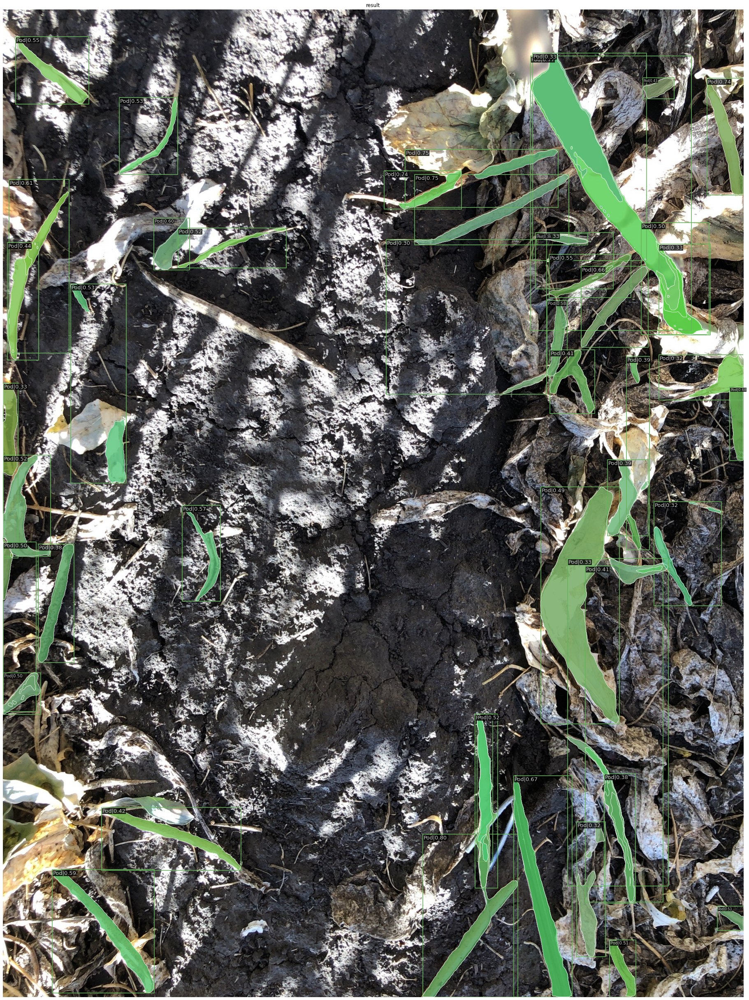

In [12]:
from mmdet.apis import inference_detector, show_result_pyplot

img = mmcv.imread('/data/workspace/data/dataset/data_canola/maskrcnn_ann_verified/4_EDRY05N2XDVS_02/ds0/img/EDRY05N2XDVS_1_19_414478957_2021-09-20T150913.jpeg')

model.cfg = cfg
result = inference_detector(model, img)
show_result_pyplot(model, img, result)

## Test and Evaluate on test dataset


In [14]:
import mmcv
from mmcv.runner import load_checkpoint

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector
from mmdet.utils import build_dp

# Choose to use a config and initialize the detector
config = os.path.join(LOGS_DIR,'my_config.py')
# Setup a checkpoint file to load
checkpoint = os.path.join(LOGS_DIR,'latest.pth')
json_file = os.path.join(LOGS_DIR,'metric.json')

# Load the config
cfg = mmcv.Config.fromfile(config)
# Set pretrained to be None since we do not need pretrained model here
# cfg.model.pretrained = None

cfg.evaluation=dict(classwise=True, metric=['bbox','segm']) 

# device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Initialize the detector
model = build_detector(cfg.model, test_cfg=cfg.get('test_cfg'))
model = build_dp(model, cfg.device, device_ids=cfg.gpu_ids)

# Load checkpoint
checkpoint = load_checkpoint(model, checkpoint, map_location='cpu')

# Set the classes of models for inference
model.CLASSES = checkpoint['meta']['CLASSES']

# We need to set the model's cfg for inference
model.cfg = cfg

# Convert the model to GPU
# model.to(device)
# Convert the model into evaluation mode
model.eval()

/opt/conda/envs/mmdetection/lib/python3.8/site-packages/mmcv/cnn/bricks/transformer.py:690: DeprecationWarning: The arguments `feedforward_channels` in BaseTransformerLayer has been deprecated, now you should set `feedforward_channels` and other FFN related arguments to a dict named `ffn_cfgs`. 
  warnings.warn(
/opt/conda/envs/mmdetection/lib/python3.8/site-packages/mmcv/cnn/bricks/transformer.py:690: DeprecationWarning: The arguments `ffn_dropout` in BaseTransformerLayer has been deprecated, now you should set `ffn_drop` and other FFN related arguments to a dict named `ffn_cfgs`. 
  warnings.warn(
/opt/conda/envs/mmdetection/lib/python3.8/site-packages/mmcv/cnn/bricks/transformer.py:690: DeprecationWarning: The arguments `ffn_num_fcs` in BaseTransformerLayer has been deprecated, now you should set `num_fcs` and other FFN related arguments to a dict named `ffn_cfgs`. 
  warnings.warn(


load checkpoint from local path: ./logs/test/latest.pth


MMDataParallel(
  (module): Mask2Former(
    (backbone): ResNet(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): ResLayer(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU

In [15]:
from mmdet.datasets import build_dataset, build_dataloader
from mmdet.apis import single_gpu_test

# Build dataset
test_dataloader_default_args = dict(
        samples_per_gpu=1, workers_per_gpu=0, dist=False, shuffle=False)
test_loader_cfg = {
        **test_dataloader_default_args,
        **cfg.data.get('test_dataloader', {})
    }

dataset = build_dataset(cfg.data.test)
data_loader = build_dataloader(dataset, **test_loader_cfg)
# data['img_metas'][0] = data['img_metas'][0].data[0]
outputs = single_gpu_test(model, data_loader)

loading annotations into memory...
Done (t=0.08s)
creating index...
index created!
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 68/68, 0.6 task/s, elapsed: 114s, ETA:     0s

In [16]:
from mmcv.runner import get_dist_info

rank, _ = get_dist_info()
if rank == 0:
    kwargs = {}
    eval_kwargs = cfg.get('evaluation', {}).copy()
    # hard-code way to remove EvalHook args
    for key in [
            'interval', 'tmpdir', 'start', 'gpu_collect', 'save_best',
            'rule', 'dynamic_intervals'
    ]:
        eval_kwargs.pop(key, None)
    eval_kwargs.update(dict(metric=['segm','bbox'], **kwargs))
    metric = dataset.evaluate(outputs, **eval_kwargs)
    print(metric)
    metric_dict = dict(config=config, metric=metric)
    if rank == 0:
        mmcv.dump(metric_dict, json_file)


Evaluating segm...
Loading and preparing results...
DONE (t=0.08s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *segm*


/root/git/mmdetection/mmdet/datasets/coco.py:470: UserWarning: The key "bbox" is deleted for more accurate mask AP of small/medium/large instances since v2.12.0. This does not change the overall mAP calculation.
  warnings.warn(


DONE (t=3.99s).
Accumulating evaluation results...
DONE (t=0.16s).

 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.017
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.047
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.009
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.027
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.059
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.059
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.059
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.011
 Average Recall     (AR) @[ IoU=0.50:0.95 | 

/opt/conda/envs/mmdetection/lib/python3.8/site-packages/pycocotools/cocoeval.py:378: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  tp_sum = np.cumsum(tps, axis=1).astype(dtype=np.float)


DONE (t=3.79s).
Accumulating evaluation results...
DONE (t=0.16s).

 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.017
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.042
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.012
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.020
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.070
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.070
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.070
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.022
 Average Recall     (AR) @[ IoU=0.50:0.95 | 